# MLOps Project work: Data preprocessing


# MLOps Project Work: Data preparation

## 1. Introduction
In this section, the preprocessing of the adult income data set wil be demonstrated. The focus will be on data cleaning and feature engineering.


## 2. Learning objectives
The following objectives will be showcasted:
- Master methods for systematic data cleaning
- Be able to apply feature engineering techniques
- Be able to create a complete preprocessing pipeline
- Understand preprocessing best practices in the MLOps context

## 3. Setup and data preparation


In [223]:
# Benötigte Bibliotheken importieren
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
import pickle
import os
import matplotlib.pyplot as plt
import seaborn as sns

# Matplotlib für deutsche Beschriftungen konfigurieren
plt.rcParams['axes.formatter.use_locale'] = True


In [224]:
# Datensatz laden
df = pd.read_csv('../data/raw/adult-income.csv')
print(f"Datensatz geladen: {df.shape} (Zeilen, Spalten)")
df

Datensatz geladen: (48842, 15) (Zeilen, Spalten)


,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
48838,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
48839,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
48840,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


## 4. Data cleaning

### 4.1 Handle missing values

Firstly, the missing values are analyzed. The data set is examined for missing values. Secondly, the distribution of missing values will be visualized. Lastly, a strategy  to handle missing values will be developed and implemented. 

We will first check for missing values. 



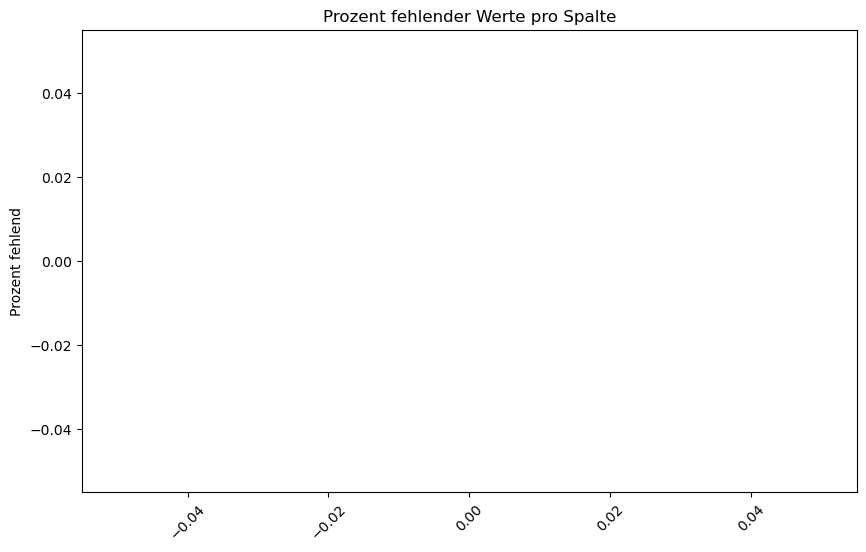

Analyse fehlender Werte:
Empty DataFrame
Columns: [Fehlende Werte, Prozent Fehlend]
Index: []


,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
48838,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
48839,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
48840,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [225]:
### SOLUTION SECTION START ###
def analyse_fehlende_werte(df):
    # Anzahl fehlender Werte pro Spalte
    fehlend = df.isnull().sum()
    
    # Prozentsatz fehlender Werte
    fehlend_prozent = (fehlend / len(df)) * 100
    
    # DataFrame mit Ergebnissen
    fehlend_info = pd.DataFrame({
        'Fehlende Werte': fehlend,
        'Prozent Fehlend': fehlend_prozent
    })
    
    # Visualisierung
    plt.figure(figsize=(10, 6))
    plt.bar(fehlend_info[fehlend_info['Fehlende Werte'] > 0].index,
            fehlend_info[fehlend_info['Fehlende Werte'] > 0]['Prozent Fehlend'])
    plt.title('Prozent fehlender Werte pro Spalte')
    plt.xticks(rotation=45)
    plt.ylabel('Prozent fehlend')
    plt.show()
    
    return fehlend_info[fehlend_info['Fehlende Werte'] > 0]


# Analyse durchführen
fehlend_analyse = analyse_fehlende_werte(df)
print("Analyse fehlender Werte:")
print(fehlend_analyse)

# Analyse durchführen
#fehlend_analyse = analyse_fehlende_werte(df)
#print("Analyse fehlender Werte:")
#print(fehlend_analyse)

# Behandlung fehlender Werte
#df['TotalCharges'] = pd.to_numeric(df['TotalCharges'], errors='coerce')
#df['TotalCharges'] = df['TotalCharges'].fillna(df['MonthlyCharges'] * df['tenure'])

#print("\nNach der Behandlung:")
#print(analyse_fehlende_werte(df))
### SOLUTION SECTION END ###


df

The analysis confirms that no values are officially missing from the dataset. Instead, from the data set (as we did in the section data exploration), we discovered there are some rows contain '?' as a placeholder, indicating potential missing data. Data are missing in the columns 'workclass', 'occupation', 'native-country'. 


The rows with '?' are to be replaced with NaN for better data handling.

In [226]:
# check for '?' in the dataset

df.isin(['?']).sum()

age                   0
workclass          2799
fnlwgt                0
education             0
educational-num       0
marital-status        0
occupation         2809
relationship          0
race                  0
gender                0
capital-gain          0
capital-loss          0
hours-per-week        0
native-country      857
income                0
dtype: int64

We can observe that Workclass has 1836 missing values, occupation has 1843 missing values and country has 583 missing values. 

Now, we replace '?' with Nan

In [227]:
# replace '?' with NaN

df['workclass']=df['workclass'].replace('?',np.nan)
df['occupation']=df['occupation'].replace('?',np.nan)
df['native-country']=df['native-country'].replace('?',np.nan)
df

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,NaN,103497,Some-college,10,Never-married,NaN,Own-child,White,Female,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
48838,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
48839,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
48840,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


After replacing '?' in the dataset, we then proceed with checking for any missing values.

In [228]:
# check for other missing values

info = pd.DataFrame(df.isnull().sum(),columns=["IsNull"])
info.insert(1,"IsNa",df.isna().sum(),True)
info.insert(2,"Duplicate",df.duplicated().sum(),True)
info.insert(3,"Unique",df.nunique(),True)


# min and max is not applied to string value
#info.insert(4,"Min",data.min(),True)
#info.insert(5,"Max",data.max(),True)


numeric_cols = ['age', 'fnlwgt', 'educational-num', 'capital-gain', 'capital-loss', 'hours-per-week']
numeric_data = df[numeric_cols]  # Create a DataFrame with only the numeric columns

if not numeric_data.empty:
    info.insert(4, "Min", numeric_data.min(), True)
    info.insert(5, "Max", numeric_data.max(), True)
else:
    print("No numeric columns found in the dataframe.")

info.T  

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
IsNull,0.0,2799.0,0.0,0.0,0.0,0.0,2809.0,0.0,0.0,0.0,0.0,0.0,0.0,857.0,0.0
IsNa,0.0,2799.0,0.0,0.0,0.0,0.0,2809.0,0.0,0.0,0.0,0.0,0.0,0.0,857.0,0.0
Duplicate,52.0,52.0,52.0,52.0,52.0,52.0,52.0,52.0,52.0,52.0,52.0,52.0,52.0,52.0,52.0
Unique,74.0,8.0,28523.0,16.0,16.0,7.0,14.0,6.0,5.0,2.0,123.0,99.0,96.0,41.0,2.0
Min,17.0,NaN,12285.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,NaN,NaN
Max,90.0,NaN,1490400.0,NaN,16.0,NaN,NaN,NaN,NaN,NaN,99999.0,4356.0,99.0,NaN,NaN


The dataset was not using the default NaN string for missing values, instead "?" is used. Now, there are no null or NaN Value. After converting '?' to NaN for the three columns 'workclass','occupation','native-country, instead, they have NaN values. 

Based on the results of data exploration, we know that there are duplicates in the dataset. 52 duplicate rows in total need to be further handled. We proceed with removing duplicated and NaN values from the dataset.




Furthermore, we discovered that duplicated columns convey the same information such as "education" and "educational-num". Both are in fact same information. Therefore, one column can dropped and the classification of educational levels can be further aggregated. Furthermore, some columns have unnecessary detail grade, for example race. The data column can be summarized into two main groups "white" and "non-white", as the race groups other than whites are already underrepresented in the dataset. While occupation is further classified into workclass. For example, machine-op-inspection, farming-fishing, craft-repair etc are classified into private workclass.

### 4.2 Handle duplicates and missing values

In this section, duplicates are identified and cleaned up. We will start with checking the record for different types of duplicates, analyzing found duplicates and deciding how to handle duplicates. At last, duplicates are cleaned up. 


In [229]:
# remove duplicates

df = df.drop_duplicates()
df.shape
df

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,NaN,103497,Some-college,10,Never-married,NaN,Own-child,White,Female,0,0,30,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
48838,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
48839,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
48840,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


We proceeed with removing duplicates. The dataset is cleansed from duplicates. After removing duplicates, we have 48790 rows (with 15 columns) in the dataset. Outliers exist in the dataset.

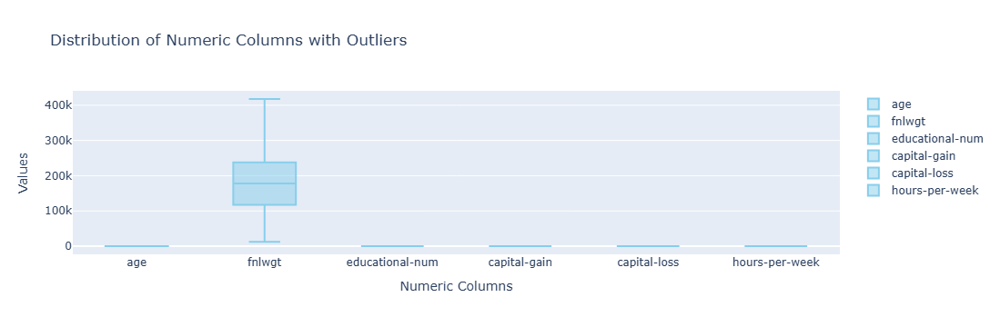

In [247]:
# Initialize a figure
fig = go.Figure()

# Iterate over numeric columns in the DataFrame
for column in df.select_dtypes(include=['number']).columns:
    fig.add_trace(go.Box(
        y=df[column],
        name=column,
        marker=dict(color='skyblue')
    ))

# Update layout with a title and axis labels
fig.update_layout(
    title='Distribution of Numeric Columns with Outliers',
    yaxis_title='Values',
    xaxis_title='Numeric Columns'
)

# Show the figure
fig.show()

Besides that, we also want to remove outliers in the dataset. 

In [249]:
# remove outliers

def outliers_handler(df,col):
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lower_limit = q1 - 1.5 * iqr
    upper_limit = q3 + 1.5 * iqr
    outliers = df[(df[col] < lower_limit) | (df[col] > upper_limit)]
    df[col] = df[col].clip(lower=lower_limit, upper=upper_limit)  
    
    return df

In [250]:
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
for i in numeric_cols:
    df=outliers_handler(df,i)

C:\Users\tanli\AppData\Local\Temp\ipykernel_16300\2930830305.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\tanli\AppData\Local\Temp\ipykernel_16300\2930830305.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\tanli\AppData\Local\Temp\ipykernel_16300\2930830305.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

Numeric columns without outliers are visualized as below.

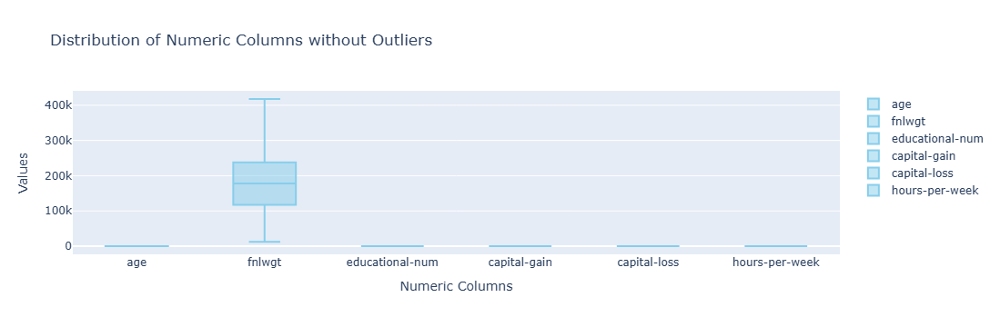

In [241]:
# Initialize a figure
import plotly.graph_objects as go
fig = go.Figure()

# Iterate over numeric columns in the DataFrame
for column in numeric_cols:
    fig.add_trace(go.Box(
        y=df[column],
        name=column,
        marker=dict(color='skyblue')
    ))

# Update layout with a title and axis labels
fig.update_layout(
    title='Distribution of Numeric Columns without Outliers',
    yaxis_title='Values',
    xaxis_title='Numeric Columns'
)

# Show the figure
fig.show()

Text(0.5, 1.0, '<=50K Income vs >50K Income Count')

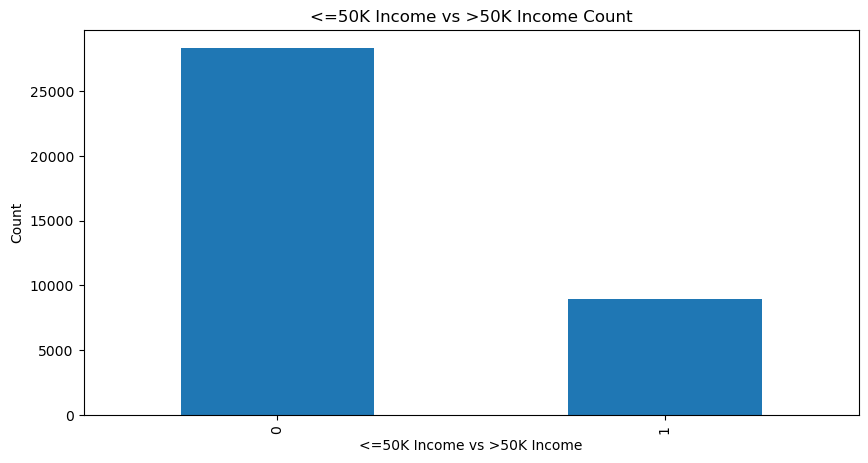

In [208]:
# count of target variable 'income'

plt.figure(figsize=(10,5))
ax = df.income.value_counts().plot(kind = 'bar')
plt.xlabel("<=50K Income vs >50K Income")
plt.ylabel("Count")
plt.title("<=50K Income vs >50K Income Count")

## 5. Feature Engineering

### 5.1 Encoding categorical variables

We will prepare the categorical variables for the next step. All categorical variables in the dataset are identified, the cardinality of each categorical variable is analyzed. Next, appropriate encoding methods are choosen for different variable types and implemented. 



In [209]:

def kategorische_variablen_kodieren(df):
    # Kategorische Spalten identifizieren
    kategorische_spalten = df.select_dtypes(include=['object']).columns
    #kategorische_spalten = kategorische_spalten[kategorische_spalten!="customerID"]
    # Kardinalität analysieren
    kardinalitaet = pd.DataFrame({
        'Spalte': kategorische_spalten,
        'Unique_Werte': [df[spalte].nunique() for spalte in kategorische_spalten]
    })
    print("Kardinalität der kategorischen Variablen:")
    print(kardinalitaet)
    
    # Encoding durchführen
    encoded_df = df.copy()
    
    # Label Encoding für binäre Variablen
    binary_encoder = LabelEncoder()
    for spalte in kategorische_spalten:
        if df[spalte].nunique() == 2:
            encoded_df[spalte] = binary_encoder.fit_transform(df[spalte])
        else:
            # One-Hot Encoding für nicht-binäre Variablen
            dummies = pd.get_dummies(df[spalte], prefix=spalte)
            encoded_df = pd.concat([encoded_df, dummies], axis=1)
            encoded_df.drop(spalte, axis=1, inplace=True)
    
    return encoded_df

# Encoding durchführen
encoded_df = kategorische_variablen_kodieren(df)
print("\nNeue Features nach Encoding:")
print(encoded_df.columns.tolist())



Kardinalität der kategorischen Variablen:
Empty DataFrame
Columns: [Spalte, Unique_Werte]
Index: []

Neue Features nach Encoding:
['age', 'workclass', 'education', 'marital-status', 'occupation', 'relationship', 'race', 'gender', 'capital-gain', 'capital-loss', 'hours-per-week', 'native-country', 'income']


### 5.2 Generating features


fnlwgt is dropped as it represents census weights that are not relevant to our project's goal, and education-num as it duplicates data present in the education feature which is used instead.



In [251]:
df=df.drop(columns=["fnlwgt", "educational-num"])
df.head()


,age,workclass,education,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,11th,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40.0,United-States,<=50K
1,38,Private,HS-grad,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50.0,United-States,<=50K
2,28,Local-gov,Assoc-acdm,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40.0,United-States,>50K
3,44,Private,Some-college,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,0,0,40.0,United-States,>50K
4,18,NaN,Some-college,Never-married,NaN,Own-child,White,Female,0,0,32.5,United-States,<=50K


The dataset contains a "native-country" feature. Howerver, other than USA, many of the features have very low numbers of observations, so they are grouped into a single category.



In [252]:
# Replace non-'United-States' values in 'native-country' with 'Others'
df.loc[df["native-country"] != "United-States", "native-country"] = "Others"
df['native-country'].unique()

array(['United-States', 'Others'], dtype=object)

In addition, the dataset has too much categories. These categories can be limited to make the dataset more clearer. We are going to limit the categorization of education and marital-status. They will limited as follows: 

- education: dropout, HighGrad (high school graduate), CommunityCollege, Bachelors, Masters, Doctorate
- marital status: NotMarried, Married, Separated, Widowed
- race: White, notWhite

This reduces the educational levels from 16 to 6, marital status from 7 to 4 and race from 5 to 2. 


In [253]:
# limit categorization of marital status
df['education'].replace('Preschool', 'dropout',inplace=True)
df['education'].replace('10th', 'dropout',inplace=True)
df['education'].replace('11th', 'dropout',inplace=True)
df['education'].replace('12th', 'dropout',inplace=True)
df['education'].replace('1st-4th', 'dropout',inplace=True)
df['education'].replace('5th-6th', 'dropout',inplace=True)
df['education'].replace('7th-8th', 'dropout',inplace=True)
df['education'].replace('9th', 'dropout',inplace=True)
df['education'].replace('HS-Grad', 'HighGrad',inplace=True)
df['education'].replace('HS-grad', 'HighGrad',inplace=True)
df['education'].replace('Some-college', 'CommunityCollege',inplace=True)
df['education'].replace('Assoc-acdm', 'CommunityCollege',inplace=True)
df['education'].replace('Assoc-voc', 'CommunityCollege',inplace=True)
df['education'].replace('Bachelors', 'Bachelors',inplace=True)
df['education'].replace('Masters', 'Masters',inplace=True)
df['education'].replace('Prof-school', 'Masters',inplace=True)
df['education'].replace('Doctorate', 'Doctorate',inplace=True)

df['education'].unique()

array(['dropout', 'HighGrad', 'CommunityCollege', 'Masters', 'Bachelors',
       'Doctorate'], dtype=object)

In [254]:
# limit categorization of marital status
df['marital-status'].replace('Never-married', 'NotMarried',inplace=True)
df['marital-status'].replace(['Married-AF-spouse'], 'Married',inplace=True)
df['marital-status'].replace(['Married-civ-spouse'], 'Married',inplace=True)
df['marital-status'].replace(['Married-spouse-absent'], 'NotMarried',inplace=True)
df['marital-status'].replace(['Separated'], 'Separated',inplace=True)
df['marital-status'].replace(['Divorced'], 'Separated',inplace=True)
df['marital-status'].replace(['Widowed'], 'Widowed',inplace=True)

df['marital-status'].unique()


array(['NotMarried', 'Married', 'Widowed', 'Separated'], dtype=object)

In [255]:
# limit categorization of race
df['race'].replace('Black', 'NotWhite',inplace=True)
df['race'].replace(['Amer-Indian-Eskimo'], 'NotWhite',inplace=True)
df['race'].replace(['Other'], 'NotWhite',inplace=True)
df['race'].replace(['Asian-Pac-Islander'], 'NotWhite',inplace=True)

df['race'].unique()

array(['NotWhite', 'White'], dtype=object)

As mentioned, there are missing values in the dataset with placeholders '?'.

In [256]:
df.isin(['?']).sum()


age               0
workclass         0
education         0
marital-status    0
occupation        0
relationship      0
race              0
gender            0
capital-gain      0
capital-loss      0
hours-per-week    0
native-country    0
income            0
dtype: int64

In [257]:
# check for other missing values

info = pd.DataFrame(df.isnull().sum(),columns=["IsNull"])
info.insert(1,"IsNa",df.isna().sum(),True)
info.insert(2,"Duplicate",df.duplicated().sum(),True)
info.insert(3,"Unique",df.nunique(),True)


# min and max is not applied to string value
#info.insert(4,"Min",data.min(),True)
#info.insert(5,"Max",data.max(),True)


numeric_cols = ['age', 'capital-gain', 'capital-loss', 'hours-per-week']
numeric_data = df[numeric_cols]  # Create a DataFrame with only the numeric columns

if not numeric_data.empty:
    info.insert(4, "Min", numeric_data.min(), True)
    info.insert(5, "Max", numeric_data.max(), True)
else:
    print("No numeric columns found in the dataframe.")

info.T  

,age,workclass,education,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
IsNull,0.0,2795.0,0.0,0.0,2805.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
IsNa,0.0,2795.0,0.0,0.0,2805.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Duplicate,11543.0,11543.0,11543.0,11543.0,11543.0,11543.0,11543.0,11543.0,11543.0,11543.0,11543.0,11543.0,11543.0
Unique,62.0,8.0,6.0,4.0,14.0,6.0,2.0,2.0,1.0,1.0,22.0,2.0,2.0
Min,17.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,32.5,NaN,NaN
Max,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,52.5,NaN,NaN


In [258]:
# Number of rows that have one null values
one_null = sum(df['workclass'].isnull() & ~df['occupation'].isnull() & ~df['native-country'].isnull()) \
           + sum(~df['workclass'].isnull() & df['occupation'].isnull() & ~df['native-country'].isnull()) \
           + sum(~df['workclass'].isnull() & ~df['occupation'].isnull() & df['native-country'].isnull())

# Number of rows that have two null values
two_null = sum(df['workclass'].isnull() & df['occupation'].isnull() & ~df['native-country'].isnull()) \
           + sum(df['workclass'].isnull() & ~df['occupation'].isnull() & df['native-country'].isnull()) \
           + sum(~df['workclass'].isnull() & df['occupation'].isnull() & df['native-country'].isnull())

# Number of rows that have three null values
three_null = sum(df['workclass'].isnull() & df['occupation'].isnull() & df['native-country'].isnull())

# Print the number of rows that have one, two and three null values
print('Number of rows that have one null values:', one_null)
print('Number of rows that have two null values:', two_null)
print('Number of rows that have three null values:', three_null)

Number of rows that have one null values: 10
Number of rows that have two null values: 2795
Number of rows that have three null values: 0


In [259]:
# before label encoding
df.head()

,age,workclass,education,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,dropout,NotMarried,Machine-op-inspct,Own-child,NotWhite,Male,0,0,40.0,United-States,<=50K
1,38,Private,HighGrad,Married,Farming-fishing,Husband,White,Male,0,0,50.0,United-States,<=50K
2,28,Local-gov,CommunityCollege,Married,Protective-serv,Husband,White,Male,0,0,40.0,United-States,>50K
3,44,Private,CommunityCollege,Married,Machine-op-inspct,Husband,NotWhite,Male,0,0,40.0,United-States,>50K
4,18,NaN,CommunityCollege,NotMarried,NaN,Own-child,White,Female,0,0,32.5,United-States,<=50K


In [264]:
# after label encoding
# make a copy of data before encoding
df1 = df.copy()


from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()

df1['gender'] = label_encoder.fit_transform(df1['gender'])
df1['workclass'] = label_encoder.fit_transform(df1['workclass'])
df1['education'] = label_encoder.fit_transform(df1['education'])
df1['marital-status'] = label_encoder.fit_transform(df1['marital-status'])
df1['occupation'] = label_encoder.fit_transform(df1['occupation'])
df1['relationship'] = label_encoder.fit_transform(df1['relationship'])
df1['race'] = label_encoder.fit_transform(df1['race'])
df1['native-country'] = label_encoder.fit_transform(df1['native-country'])
df1['income'] = label_encoder.fit_transform(df1['income'])

# after label encoding
df1.head()


,age,workclass,education,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,3,5,1,6,3,0,1,0,0,40.0,1,0
1,38,3,3,0,4,0,1,1,0,0,50.0,1,0
2,28,1,1,0,10,0,1,1,0,0,40.0,1,1
3,44,3,1,0,6,0,0,1,0,0,40.0,1,1
4,18,8,1,1,14,3,1,0,0,0,32.5,1,0


The label encoded data is written to csv file.

In [263]:
# writing to a csv file
# df1 is data after processed

df1.to_csv('data/raw/adult-income-processed.csv', index=False)
